## Définition (rappel)
 
Soit $f : A \to \mathbb{R}$ continue, $A \subset \mathbb{R}^n$ **fermé non borné**.

$f$ est **coercive** si :
$$\lim_{\|x\|\to +\infty,\, x\in A} f(x) = +\infty$$

## Pourquoi c’est important ?

- Sans coercivité, une fonction continue sur un fermé non borné **peut ne pas avoir de minimum**.
- Avec coercivité + fermé → **existence d’un minimum global**.

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from IPython.display import HTML

# Style
plt.rcParams['figure.figsize'] = (8,6)
plt.rcParams['font.size'] = 12

## 1. Cas coercif : 

$$f(x,y) = x^2 + y^2 + 0.5 \sin(x) \cos(y)$$
tend vers $+\infty$ dans toutes les directions.

Text(0.5, 0, 'f(x,y)')

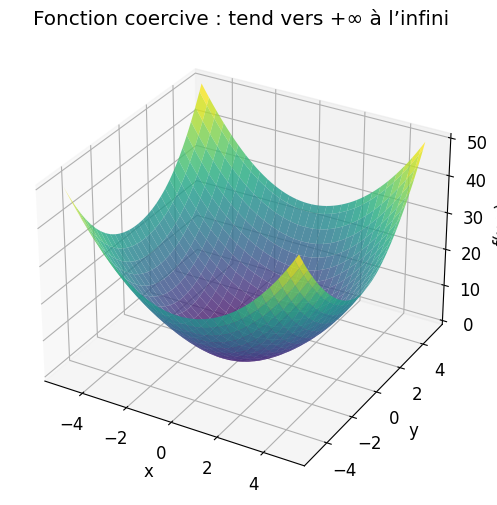

In [4]:
def f_coercive(x, y):
    return x**2 + y**2 + 0.5 * np.sin(x) * np.cos(y)

# Grille
x = np.linspace(-5, 5, 60)
y = np.linspace(-5, 5, 60)
X, Y = np.meshgrid(x, y)
Z = f_coercive(X, Y)

# Création figure
fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(X, Y, Z, cmap='viridis', alpha=0.8, edgecolor='none')
ax.set_title("Fonction coercive : tend vers +∞ à l’infini")
ax.set_xlabel("x"); ax.set_ylabel("y"); ax.set_zlabel("f(x,y)")

## 2. Cas non coercif : 
$$f(x,y) = e^{-(x^2 + y^2)/10} + 0.5$$
tend vers **0.5** (une constante) à l’infini → **pas de minimum global**

Text(0.5, 0, 'f(x,y)')

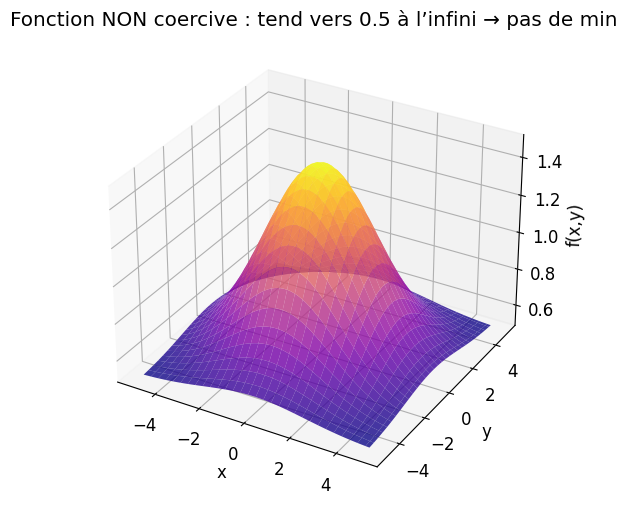

In [5]:
def f_non_coercive(x, y):
    return np.exp(-(x**2 + y**2)/10) + 0.5

Z2 = f_non_coercive(X, Y)

fig2 = plt.figure(figsize=(8,6))
ax2 = fig2.add_subplot(111, projection='3d')
ax2.plot_surface(X, Y, Z2, cmap='plasma', alpha=0.8, edgecolor='none')
ax2.set_title("Fonction NON coercive : tend vers 0.5 à l’infini → pas de min")
ax2.set_xlabel("x"); ax2.set_ylabel("y"); ax2.set_zlabel("f(x,y)")

## 3. Comparaison coupe 1D (pour bien voir la tendance à l'infini)

On fixe $y=0$ et on regarde $f(x,0)$.

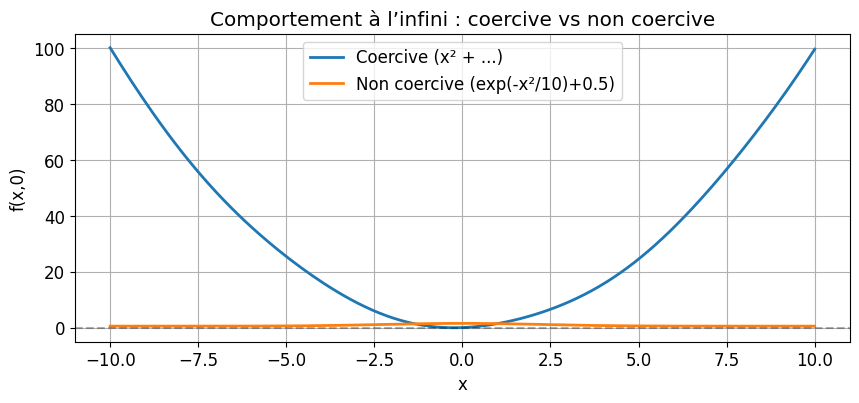

In [6]:
x_line = np.linspace(-10, 10, 200)

f1_line = x_line**2 + 0.5*np.sin(x_line)  # coercive
f2_line = np.exp(-x_line**2/10) + 0.5     # non coercive

plt.figure(figsize=(10,4))
plt.plot(x_line, f1_line, label="Coercive (x² + ...)", lw=2)
plt.plot(x_line, f2_line, label="Non coercive (exp(-x²/10)+0.5)", lw=2)
plt.axhline(0, color='k', linestyle='--', alpha=0.3)
plt.xlabel("x"); plt.ylabel("f(x,0)")
plt.title("Comportement à l’infini : coercive vs non coercive")
plt.legend()
plt.grid(True)
plt.show()

## 4. Animation 3D avec caméra qui s’éloigne pour voir l’infini

(simulation d’un zoom arrière)

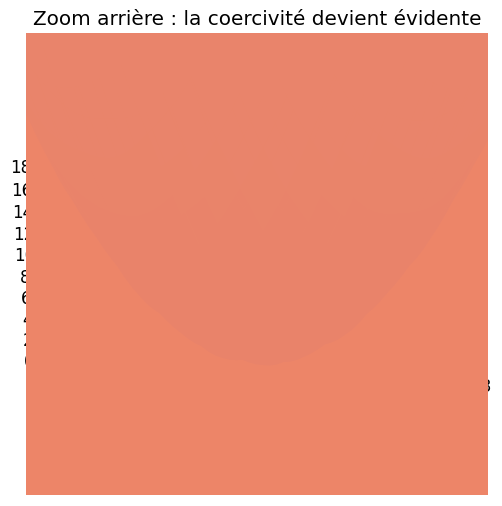

In [10]:
def f_zoom(x, y):
    return x**2 + y**2 + 0.2*np.sin(3*x)*np.cos(3*y)

Xz = np.linspace(-15, 15, 150)
Yz = np.linspace(-15, 15, 150)
Xz, Yz = np.meshgrid(Xz, Yz)
Zz = f_zoom(Xz, Yz)

fig3 = plt.figure(figsize=(8,6))
ax3 = fig3.add_subplot(111, projection='3d')
surf = ax3.plot_surface(Xz, Yz, Zz, cmap='coolwarm', alpha=0.7, edgecolor='none')
ax3.set_title("Zoom arrière : la coercivité devient évidente")

def update_zoom(scale):
    ax3.set_xlim(-scale, scale)
    ax3.set_ylim(-scale, scale)
    ax3.set_zlim(0, 2*scale**2)
    ax3.view_init(elev=25, azim=45)
    return fig3,

ani_zoom = animation.FuncAnimation(fig3, update_zoom, frames=np.linspace(3, 12, 40), interval=100, blit=False)
HTML(ani_zoom.to_jshtml())

## Conclusion

- Une **fonction coercive** "remonte" vers $+\infty$ partout à l’infini.
- Une fonction **non coercive** peut rester bornée, voire tendre vers une valeur finie → on risque de **ne pas avoir de minimum** global sur un ensemble fermé non borné.
- La coercivité est une **condition suffisante** pour garantir l’existence d’un minimum (avec la continuité et le caractère fermé de $A$).

------

## Exemple : minimisation du coût d’un stock
Une usine doit produire une quantité fixe $Q = 1000$ unités d’un produit par an.  
Elle peut choisir la taille $x$ de chaque lot de production.

**Coût total annuel** (modèle de Wilson simplifié) :
$$C(x) = \frac{1000}{x} \cdot c_f + \frac{x}{2} \cdot c_s$$
avec :
- $c_f = 200$ € : coût fixe par lancement de production
- $c_s = 5$ € : coût de stockage par unité et par an

Soit :
$$C(x) = \frac{200\,000}{x} + 2.5\,x$$
où $x > 0$ est la taille du lot (variable réelle positive).

**Domaine** : $A = (0, +\infty)$ (fermé ? non, car $0$ exclu mais on peut l’ajouter par prolongement infini)

---

### 1. Analyse du comportement

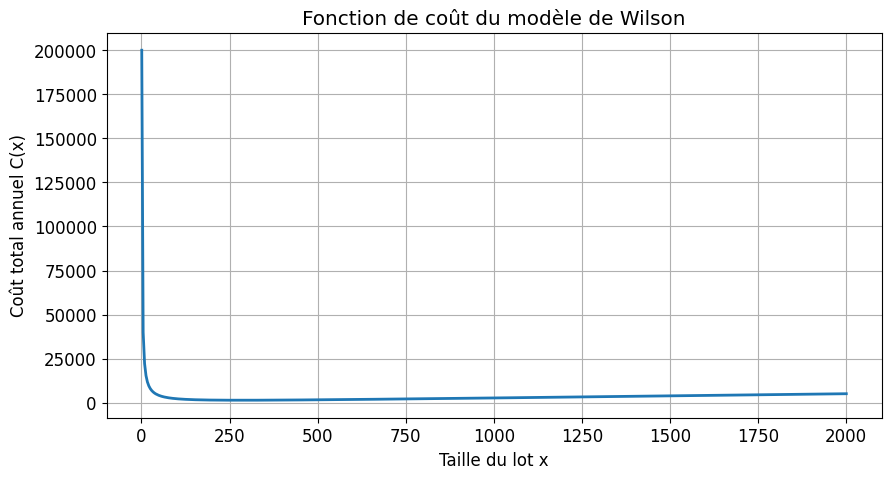

In [11]:
import numpy as np
import matplotlib.pyplot as plt

x = np.linspace(1, 2000, 500)
C = 200000/x + 2.5*x

plt.figure(figsize=(10,5))
plt.plot(x, C, lw=2)
plt.xlabel("Taille du lot x")
plt.ylabel("Coût total annuel C(x)")
plt.title("Fonction de coût du modèle de Wilson")
plt.grid(True)
plt.show()

Ce que l’on observe :
- Quand $x \to 0^+$ : $\frac{200000}{x} \to +\infty$
- Quand $ \to +\infty$ : $2.5x \to +\infty$
- Il existe un **minimum** en $x^* = \sqrt{\frac{200000}{2.5}} = \sqrt{80000} \approx 282.8$

Ici → **minimum global existe** (coercive).

---

### 2. Contre-exemple : modèle sans coût de stockage

Supprimons le coût de stockage (cas irréaliste mais pédagogique) :
$$C_{\text{sans stock}}(x) = \frac{200\,000}{x}$$
Domaine : $x > 0$

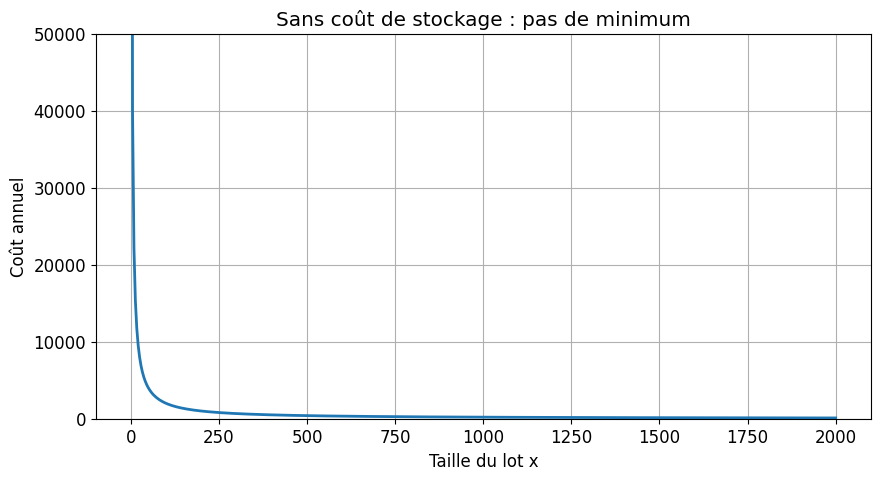

In [12]:
C2 = 200000/x

plt.figure(figsize=(10,5))
plt.plot(x, C2, lw=2)
plt.xlabel("Taille du lot x")
plt.ylabel("Coût annuel")
plt.title("Sans coût de stockage : pas de minimum")
plt.ylim(0, 50000)
plt.grid(True)
plt.show()

**Observation** :
- Quand $ \to 0^+$ : coût $\to +\infty$
- Quand $x \to +\infty$ : coût $\to 0^+$ mais **jamais égal à 0**
- Infimum $= 0$, mais **non atteint**

**Pas de minimum global**.

---

### 3. Pourquoi ce problème n’a-t-il pas de minimum ?

| Condition | Vérification |
|-----------|---------------|
| Domaine $A = (0, +\infty)$ | **Non fermé** (0 exclu, mais surtout non borné) |
| Fonction continue | ✅ |
| Coercive ? | ❌ $\lim_{x\to +\infty} C(x) = 0 \neq +\infty$ |

La **non-coercivité** (tendance vers 0 à l’infini) empêche l’existence d’un minimum.

---

### 4. Quels sont les **dangers** en pratique ?

#### a) Décision impossible
L’optimiseur ne peut pas fournir une solution.  
*Dans notre exemple : l’algorithme continuerait à augmenter $x$ indéfiniment.*

#### b) Instabilité numérique
Un solveur numérique (simplexe, gradient) pourrait diverger ou renvoyer une très grande valeur sans convergence.

#### c) Interprétation économique absurde
- Augmenter la taille du lot réduit le nombre de lancements, donc le coût.
- Mais sans coût de stockage, on produit une fois par an (ou moins) → **en pratique impossible** (besoin de trésorerie, rupture, délais).

#### d) Modélisation incomplète
Le vrai problème **doit** contenir un coût de stockage ($\frac{x}{2} \cdot c_s$) pour être coercif.

---

### 5. Correction : rendre le problème coercif

Ajoutons un **terme quadratique** (coût de stockage) :
$$C(x) = \frac{200000}{x} + 2.5x + \varepsilon x^2$$
Avec $\varepsilon > 0$ très petit.

Quand $x \to +\infty$ : $\varepsilon x^2$ domine → $C(x) \to +\infty$ devient coercif.

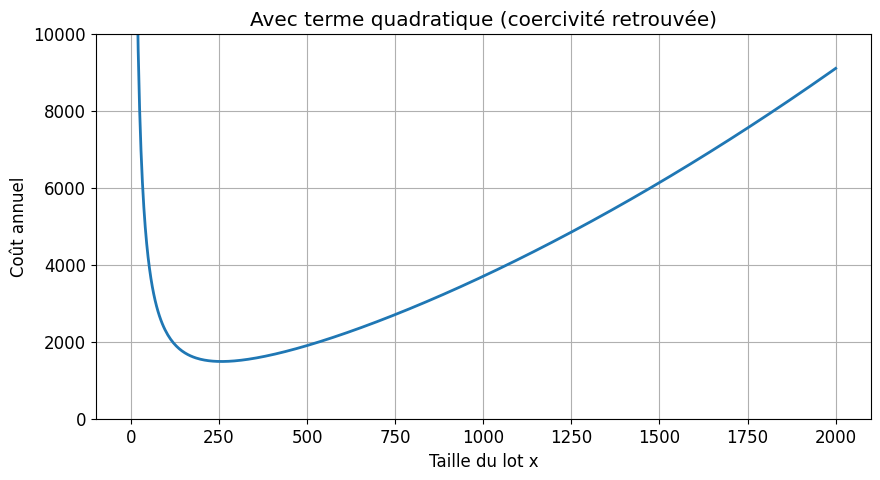

In [13]:
eps = 0.001
C3 = 200000/x + 2.5*x + eps*x**2

plt.figure(figsize=(10,5))
plt.plot(x, C3, lw=2)
plt.xlabel("Taille du lot x")
plt.ylabel("Coût annuel")
plt.title("Avec terme quadratique (coercivité retrouvée)")
plt.ylim(0, 10000)
plt.grid(True)
plt.show()

---

### 6. Conclusion

> **Sans coercivité, un problème d’optimisation sur un domaine non borné peut ne pas avoir de solution.**

| Conséquence | Explication |
|-------------|-------------|
| Pas de décision optimale | L’algorithme ne converge pas |
| Infimum non atteint | On s’approche sans jamais atteindre |
| Modèle non réaliste | Manque un terme physique (stockage, frottement, pénalité) |

**Règle d’or en modélisation** :  
Vérifier que la fonction objectif est **coercive** sur le domaine admissible, ou **borner artificiellement** les variables.

---

### Question supplémentaire

> Proposez une **modification minimale** du problème de stockage ci‑dessus (sans coût de stockage) pour qu’il devienne coercive **sans ajouter de terme quadratique**.

**Indice** : Ajouter une borne supérieure sur $x$.